# Aditya Sharma 24115013 Codebase
## This is the final codebase notebook for the contest Pixel Play'25 Challenge.

## Importing the neccesary libraries

In [1]:
import numpy as np
import pandas as pd
import random
import PIL
from pathlib import Path
from PIL import Image
from tqdm import tqdm
from numpy import expand_dims

# Import visualization libraries
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import cv2
import seaborn as sns

# Tensorflow Libraries
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers,models
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import Callback, EarlyStopping, ReduceLROnPlateau
from tensorflow.keras import Model
from tensorflow.keras.layers import *
from tensorflow.keras.optimizers import Adam

# System libraries
from pathlib import Path
import os.path

# Metrics
from keras.layers import Input, Dense, Activation, Dropout
from keras.layers import Flatten, BatchNormalization
from keras.layers import Convolution2D, MaxPooling2D, AveragePooling2D, GlobalAveragePooling2D 
from tensorflow.keras.applications import InceptionV3
from sklearn.model_selection import train_test_split

## Initialization of the dataset

In [2]:
import tensorflow.python.keras.backend as K
def seed_everything(seed=42):
    # Seed value for TensorFlow
    tf.random.set_seed(seed)
    
    # Seed value for NumPy
    np.random.seed(seed)
    
    # Seed value for Python's random library
    random.seed(seed)
    
    # Force TensorFlow to use single thread
    # Multiple threads are a potential source of non-reproducible results.
    session_conf = tf.compat.v1.ConfigProto(
        intra_op_parallelism_threads=1,
        inter_op_parallelism_threads=1
    )
       # Make sure that TensorFlow uses a deterministic operation wherever possible
    tf.compat.v1.set_random_seed(seed)

    sess = tf.compat.v1.Session(graph=tf.compat.v1.get_default_graph(), config=session_conf)
    K.set_session(sess)

seed_everything()

Here I am using the external dataset which is a mixture of pixel play dataset and external dataset added by me through various sources.
This is due to the unavailability of the given 10 classes. 
The main aim was to increase the amount of data to train a better model for the classification task of 50 animal classes.

In [3]:
# Declaring the variables needed to be used
BATCH_SIZE = 32
TARGET_SIZE = (256, 256)

dataset = "/kaggle/input/pixelplay"

In [4]:
# Converting the dataframe for our dataset
def convert_path_to_df(dataset):
    image_dir = Path(dataset)

    # Get filepaths and labels
    filepaths = list(image_dir.glob(r'**/*.JPG')) + list(image_dir.glob(r'**/*.jpg')) + list(image_dir.glob(r'**/*.jpeg')) + list(image_dir.glob(r'**/*.PNG')) + list(image_dir.glob(r'**/*.png'))

    labels = list(map(lambda x: os.path.split(os.path.split(x)[0])[1], filepaths))

    filepaths = pd.Series(filepaths, name='Filepath').astype(str)
    labels = pd.Series(labels, name='Label')

    # Concatenate filepaths and labels
    image_df = pd.concat([filepaths, labels], axis=1)
    return image_df

image_df = convert_path_to_df(dataset)
image_df

,Filepath,Label
0,/kaggle/input/pixelplay/train/fox/fox7111.jpg,fox
1,/kaggle/input/pixelplay/train/fox/fox6894.jpg,fox
2,/kaggle/input/pixelplay/train/fox/fox7064.jpg,fox
3,/kaggle/input/pixelplay/train/fox/fox6877.jpg,fox
4,/kaggle/input/pixelplay/train/fox/fox6885.jpg,fox
...,...,...
23889,/kaggle/input/pixelplay/train/walrus/walrus223...,walrus
23890,/kaggle/input/pixelplay/train/walrus/walrus221...,walrus
23891,/kaggle/input/pixelplay/train/walrus/walrus223...,walrus
23892,/kaggle/input/pixelplay/train/walrus/walrus220...,walrus


In [5]:
# Checking the count of every class in our dataset
image_df['Label'].value_counts()

Label
fox                500
gorilla            500
killer+whale       500
siamese+cat        500
wolf               500
chihuahua          500
polar+bear         500
german+shepherd    500
elephant           500
zebra              500
seal               500
cow                500
giraffe            500
rhinoceros         500
dolphin            500
squirrel           500
leopard            500
deer               500
weasel             500
dalmatian          500
humpback+whale     500
raccoon            500
hippopotamus       500
horse              500
antelope           500
chimpanzee         500
lion               500
otter              500
giant+panda        500
bat                500
walrus             500
tiger              500
mouse              500
rat                500
spider+monkey      500
skunk              495
collie             476
buffalo            466
beaver             456
rabbit             453
persian+cat        439
moose              421
blue+whale         417
sheep

Here are the count of the images for the particular class of animal.

In [6]:
# Preparing the dataframe for test
image_dir = Path('/kaggle/input/vlg-recruitment-24-challenge/vlg-dataset/vlg-dataset/test')

# Get filepaths and labels
filepaths = list(image_dir.glob(r'**/*.JPG')) + list(image_dir.glob(r'**/*.jpg')) + list(image_dir.glob(r'**/*.jpeg')) + list(image_dir.glob(r'**/*.PNG'))

labels = list(map(lambda x: os.path.split(os.path.split(x)[1])[1], filepaths))

filepaths = pd.Series(filepaths, name='Filepath').astype(str)
labels = pd.Series(labels, name='image_id')

# Concatenate filepaths and labels
test_df = pd.concat([filepaths, labels], axis=1)
test_df

,Filepath,image_id
0,/kaggle/input/vlg-recruitment-24-challenge/vlg...,02371.jpg
1,/kaggle/input/vlg-recruitment-24-challenge/vlg...,00767.jpg
2,/kaggle/input/vlg-recruitment-24-challenge/vlg...,02360.jpg
3,/kaggle/input/vlg-recruitment-24-challenge/vlg...,00266.jpg
4,/kaggle/input/vlg-recruitment-24-challenge/vlg...,02450.jpg
...,...,...
2995,/kaggle/input/vlg-recruitment-24-challenge/vlg...,02731.jpg
2996,/kaggle/input/vlg-recruitment-24-challenge/vlg...,01325.jpg
2997,/kaggle/input/vlg-recruitment-24-challenge/vlg...,00222.jpg
2998,/kaggle/input/vlg-recruitment-24-challenge/vlg...,02956.jpg


In [7]:
# Creating dummy labels for dataframe for flow from dataframe query
test_df['label']=image_df[:3000]['Label']
test_df

,Filepath,image_id,label
0,/kaggle/input/vlg-recruitment-24-challenge/vlg...,02371.jpg,fox
1,/kaggle/input/vlg-recruitment-24-challenge/vlg...,00767.jpg,fox
2,/kaggle/input/vlg-recruitment-24-challenge/vlg...,02360.jpg,fox
3,/kaggle/input/vlg-recruitment-24-challenge/vlg...,00266.jpg,fox
4,/kaggle/input/vlg-recruitment-24-challenge/vlg...,02450.jpg,fox
...,...,...,...
2995,/kaggle/input/vlg-recruitment-24-challenge/vlg...,02731.jpg,chimpanzee
2996,/kaggle/input/vlg-recruitment-24-challenge/vlg...,01325.jpg,chimpanzee
2997,/kaggle/input/vlg-recruitment-24-challenge/vlg...,00222.jpg,chimpanzee
2998,/kaggle/input/vlg-recruitment-24-challenge/vlg...,02956.jpg,chimpanzee


Here dummy label are being given for the test dataset for the image datagenerator declared in afterwards. 
No usage of these classes are done in prediction

In [8]:
# Adding height and width of image for better understanding
widths, heights = [], []

for path in tqdm(image_df["Filepath"]):
    width, height = Image.open(path).size
    widths.append(width)
    heights.append(height)
    
image_df["width"] = widths
image_df["height"] = heights
image_df["dimension"] = image_df["width"] * image_df["height"]

100%|██████████| 23894/23894 [01:40<00:00, 237.84it/s]


In [9]:
image_df

,Filepath,Label,width,height,dimension
0,/kaggle/input/pixelplay/train/fox/fox7111.jpg,fox,256,256,65536
1,/kaggle/input/pixelplay/train/fox/fox6894.jpg,fox,512,512,262144
2,/kaggle/input/pixelplay/train/fox/fox7064.jpg,fox,256,256,65536
3,/kaggle/input/pixelplay/train/fox/fox6877.jpg,fox,512,512,262144
4,/kaggle/input/pixelplay/train/fox/fox6885.jpg,fox,512,512,262144
...,...,...,...,...,...
23889,/kaggle/input/pixelplay/train/walrus/walrus223...,walrus,512,512,262144
23890,/kaggle/input/pixelplay/train/walrus/walrus221...,walrus,500,332,166000
23891,/kaggle/input/pixelplay/train/walrus/walrus223...,walrus,512,512,262144
23892,/kaggle/input/pixelplay/train/walrus/walrus220...,walrus,1024,683,699392


It can be seen that the our dataset has quite a better image sizes.

In [10]:
# Checking the corrupted image
path = Path(dataset).rglob("*.jpg")
for img_p in path:
    try:
        img = Image.open(img_p)
    except PIL.UnidentifiedImageError:
            print(img_p)

Good for us as no image is corrupted

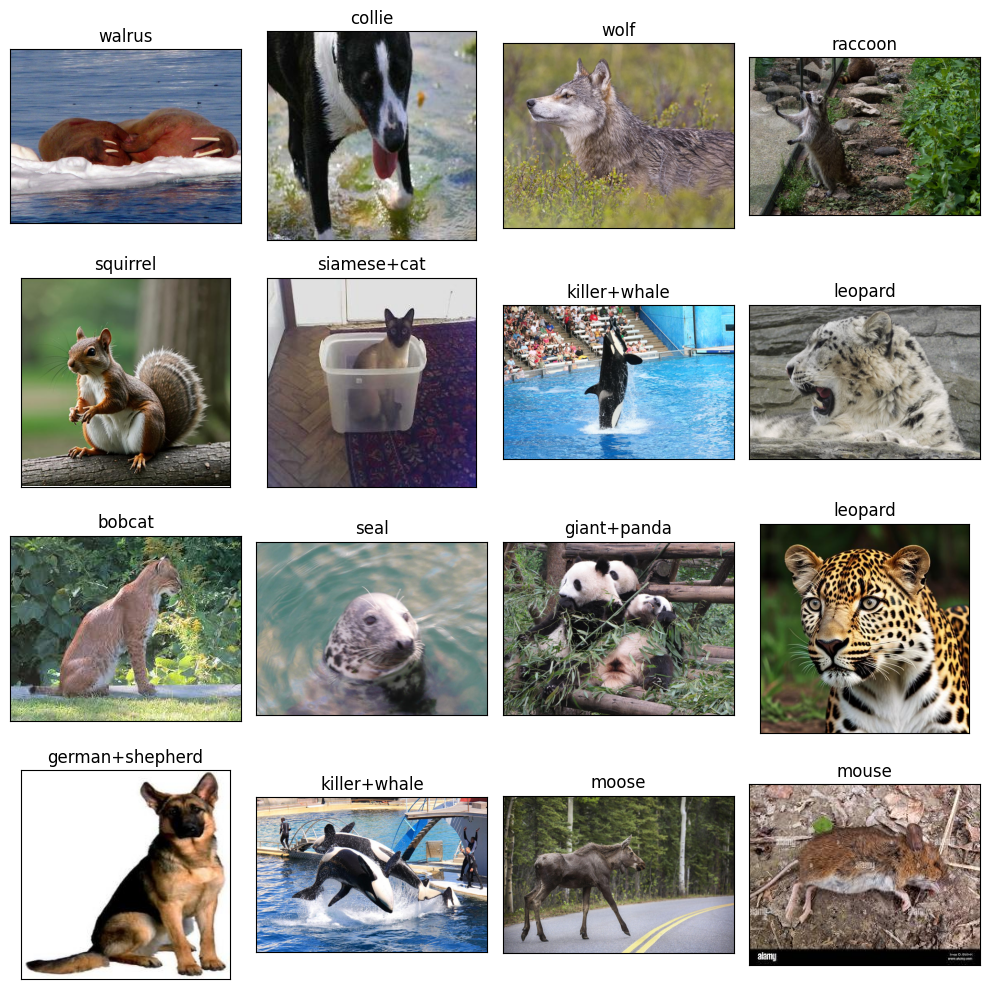

In [11]:
# Trying to get a brief outlook of our dataset 
random_index = np.random.randint(0, len(image_df), 24)

fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(10, 10),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    ax.imshow(plt.imread(image_df.Filepath[random_index[i]]))
    ax.set_title(image_df.Label[random_index[i]])
plt.tight_layout()
plt.show()

In [12]:
# Separate in train and test data
train_df, valid_df = train_test_split(image_df, test_size=0.2, shuffle=True, random_state=13)
train_df = train_df.reset_index(drop=True)
valid_df = valid_df.reset_index(drop=True)

## Using InceptionV3 Pretrained Model

In [13]:
from tensorflow.keras.applications.inception_v3 import preprocess_input
# Preparing the data for preprocessing
inceptionv3_datagen = ImageDataGenerator(
    rotation_range=25,
    zoom_range=0.10,
    brightness_range=[0.5,1.4],
    channel_shift_range=0.7,
    width_shift_range=0.15,
    height_shift_range=0.15,
    shear_range=0.15,
    horizontal_flip=True,
    fill_mode='nearest',
    preprocessing_function=preprocess_input
)

test_datagen = ImageDataGenerator(
     preprocessing_function=preprocess_input
)

# # Split the data into three categories.
train_images_inceptionv3 = inceptionv3_datagen.flow_from_dataframe(
    dataframe=train_df,
    x_col='Filepath',
    y_col='Label',
    target_size=TARGET_SIZE,
    color_mode='rgb',
    class_mode='categorical',
    batch_size=BATCH_SIZE,
    shuffle=True,
    seed=42
)

val_images_inceptionv3 = inceptionv3_datagen.flow_from_dataframe(
    dataframe=valid_df,
    x_col='Filepath',
    y_col='Label',
    target_size=TARGET_SIZE,
    color_mode='rgb',
    class_mode='categorical',
    batch_size=BATCH_SIZE,
    shuffle=False,
)

test_images_inceptionv3 = test_datagen.flow_from_dataframe(
    dataframe=test_df,
    x_col='Filepath',
    y_col='label',
    target_size=TARGET_SIZE,
    color_mode='rgb',
    class_mode='categorical',
    batch_size=BATCH_SIZE,
    shuffle=False
)

Found 19115 validated image filenames belonging to 50 classes.
Found 4779 validated image filenames belonging to 50 classes.
Found 3000 validated image filenames belonging to 7 classes.


## Model Training

In [14]:
# inceptionv3 = InceptionV3(include_top = False, input_shape = (256,256,3), weights = 'imagenet')

# # training of all the convolution is set to false
# for layer in inceptionv3.layers:
#     layer.trainable = False

# x = GlobalAveragePooling2D()(inceptionv3.output)
# predictions = Dense(50, activation='softmax')(x)

# # Giving the final structure to our model
# model_inceptionv3 = Model(inputs = inceptionv3.input, outputs = predictions)

# # Compiling the model with Adam optimizer and using accuracy as metrics
# model_inceptionv3.compile(loss='categorical_crossentropy', optimizer=Adam(0.0001), metrics=['accuracy'])

In [15]:
# # Having an early stopping for our our model to avoid overfitting
# early_stopping = EarlyStopping(monitor = "val_loss", # watch the val loss metric
#                                patience = 5,
#                                restore_best_weights = True)

# # Tuning the learning rate as per progress in val_loss
# reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=2, min_lr=1e-6)

# # Fitting Our inceptionv3 model
# history_inceptionv3 = model_inceptionv3.fit(
#       train_images_inceptionv3,
#       validation_data=val_images_inceptionv3,
#       epochs=30,
#       callbacks = [early_stopping, reduce_lr],
#       verbose=2)

## Saving our trained model

In [16]:
# model_inceptionv3.save('model_inceptionv3.h5')

## Prediction Through the trained model

In [17]:
# #Predict the label of the test_images
# pred = model_inceptionv3.predict(test_images_inceptionv3)
# pred = np.argmax(pred,axis=1)

# # Map the label
# labels = (train_images_inceptionv3.class_indices)
# labels = dict((v,k) for k,v in labels.items())
# pred = [labels[k] for k in pred]

## Creating the submission file

In [18]:
# submission = pd.DataFrame()
# submission['image_id'] = test_df['image_id']
# submission['class'] = pred

# submission = submission.sort_values('image_id')

# submission.to_csv('submission_inception1.csv', index=False)

## Using the final trained model

In [19]:
model=tf.keras.models.load_model('/kaggle/input/notebookd39fbcd38c/model_inceptionv3.h5')

In [20]:
# Predicting the structure of the model
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 256, 256, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d (Conv2D)           │ (None, 127, 127, 32)   │            864 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization       │ (None, 127, 127, 32)   │             96 │ conv2d[0][0]           │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation (Activation)   │ (None, 127, 127, 32)   │              0 │ batch_normalization[0… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_1 (Conv2D)         │ (None, 125, 125, 32)   │          9,216 │ activation[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_1     │ (None, 125, 125, 32)   │             96 │ conv2d_1[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_1 (Activation) │ (None, 125, 125, 32)   │              0 │ batch_normalization_1… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_2 (Conv2D)         │ (None, 125, 125, 64)   │         18,432 │ activation_1[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_2     │ (None, 125, 125, 64)   │            192 │ conv2d_2[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_2 (Activation) │ (None, 125, 125, 64)   │              0 │ batch_normalization_2… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d             │ (None, 62, 62, 64)     │              0 │ activation_2[0][0]     │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_3 (Conv2D)         │ (None, 62, 62, 80)     │          5,120 │ max_pooling2d[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_3     │ (None, 62, 62, 80)     │            240 │ conv2d_3[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_3 (Activation) │ (None, 62, 62, 80)     │              0 │ batch_normalization_3… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_4 (Conv2D)         │ (None, 60, 60, 192)    │        138,240 │ activation_3[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_4     │ (None, 60, 60, 192)    │            576 │ conv2d_4[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_4 (Activat

 Total params: 21,905,236 (83.56 MB)

 Trainable params: 102,450 (400.20 KB)

 Non-trainable params: 21,802,784 (83.17 MB)

 Optimizer params: 2 (12.00 B)

In [21]:
preds = model.predict(val_images_inceptionv3)
preds = np.argmax(preds,axis=1)

# Map the label
labels = (train_images_inceptionv3.class_indices)
labels = dict((v,k) for k,v in labels.items())
preds = [labels[k] for k in preds]

/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


150/150 ━━━━━━━━━━━━━━━━━━━━ 483s 3s/step


Predicted:  pig 	 Actual:  mouse


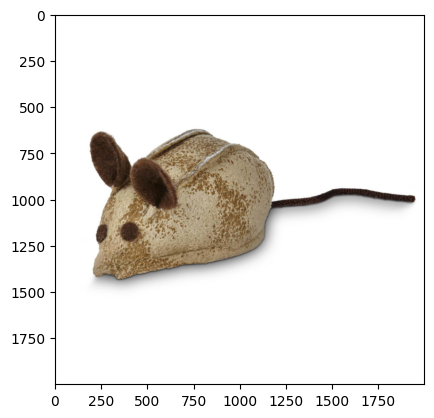

Predicted:  lion 	 Actual:  bobcat


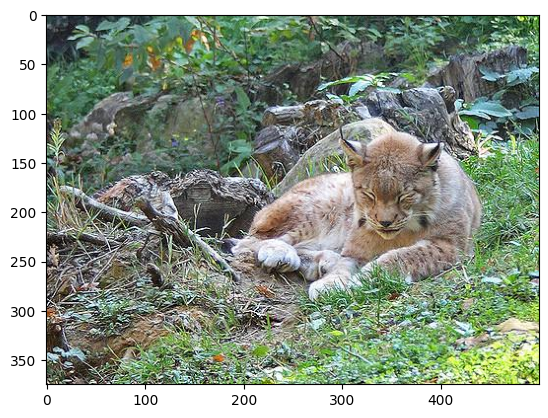

Predicted:  humpback+whale 	 Actual:  buffalo


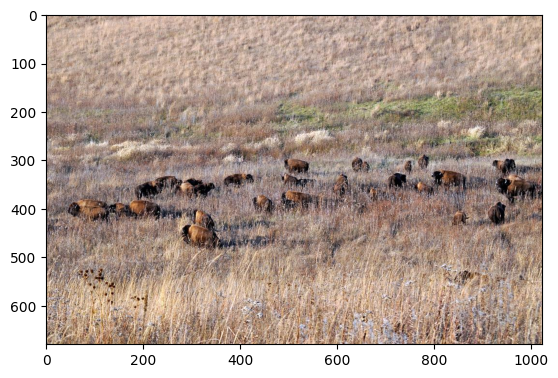

Predicted:  hamster 	 Actual:  rat


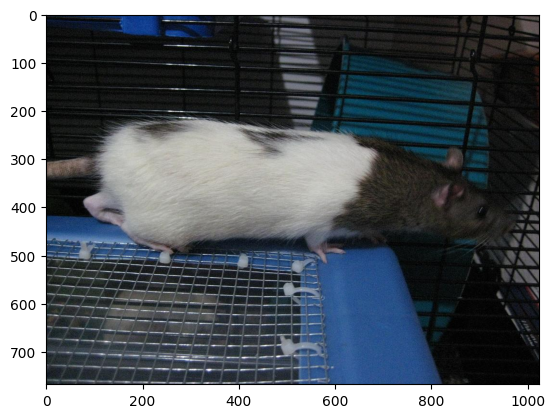

Predicted:  hippopotamus 	 Actual:  seal


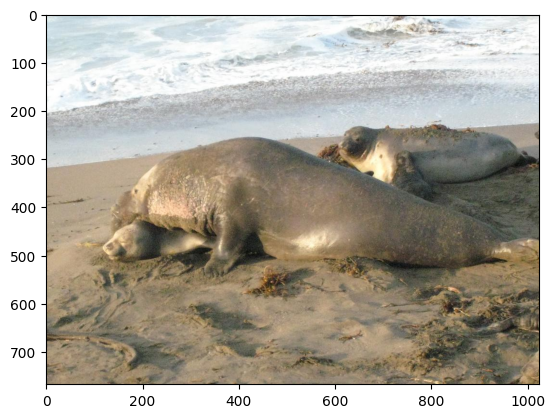

Predicted:  hamster 	 Actual:  rat


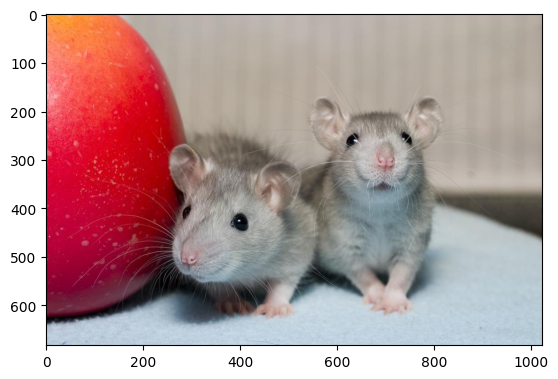

Predicted:  ox 	 Actual:  horse


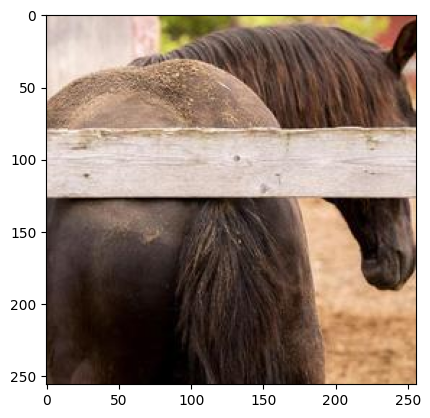

Predicted:  blue+whale 	 Actual:  killer+whale


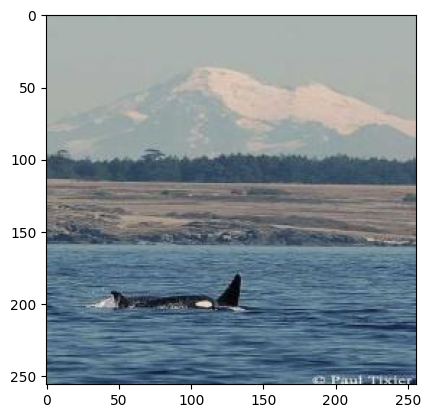

Predicted:  bat 	 Actual:  chihuahua


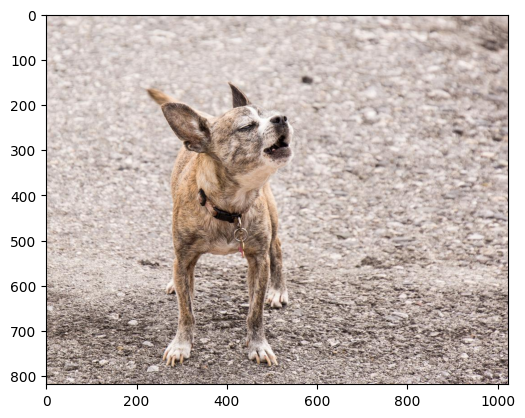

Predicted:  gorilla 	 Actual:  chimpanzee


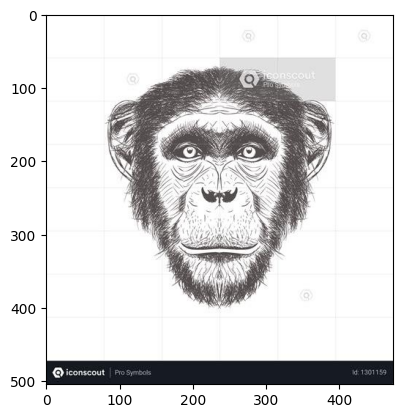

Predicted:  raccoon 	 Actual:  persian+cat


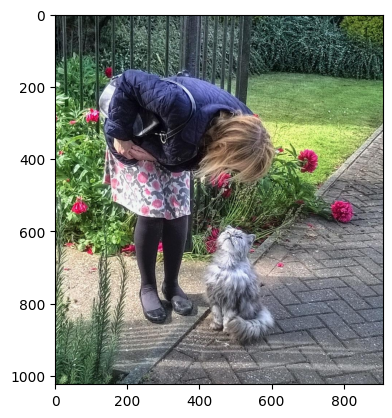

Predicted:  hamster 	 Actual:  rat


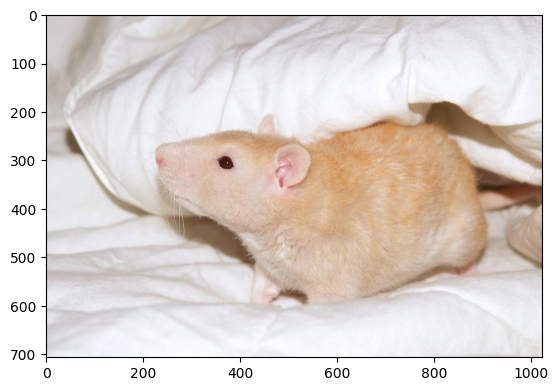

Predicted:  hippopotamus 	 Actual:  cow


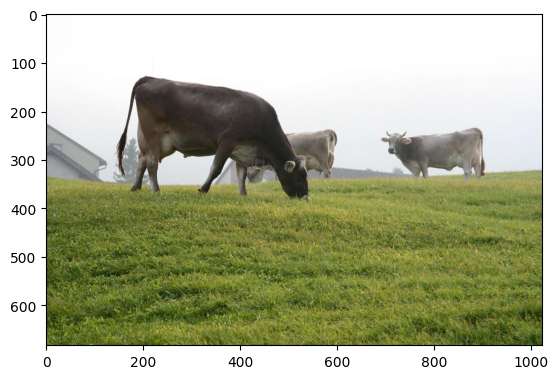

Predicted:  seal 	 Actual:  otter


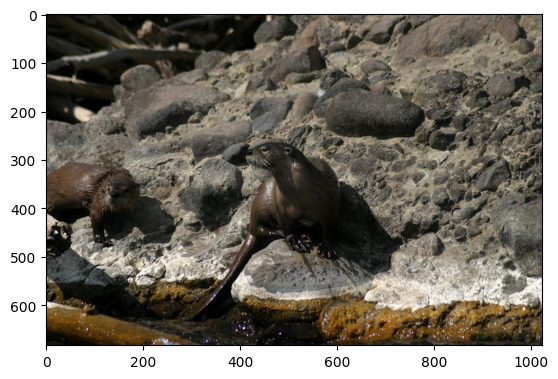

Predicted:  hamster 	 Actual:  mouse


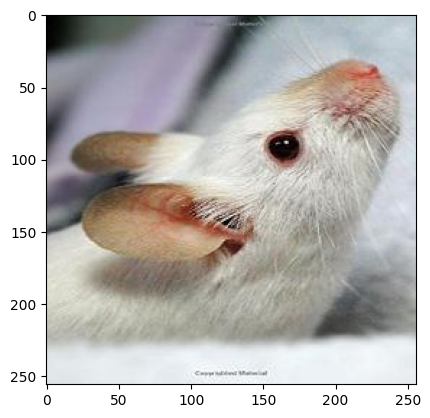

Predicted:  rabbit 	 Actual:  chihuahua


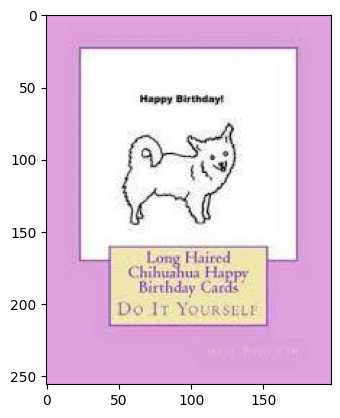

Predicted:  hippopotamus 	 Actual:  beaver


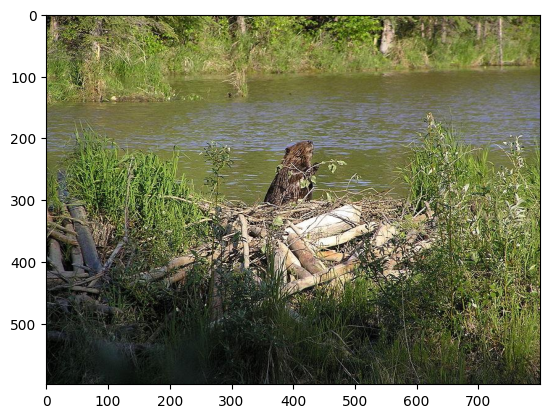

Predicted:  rat 	 Actual:  mouse


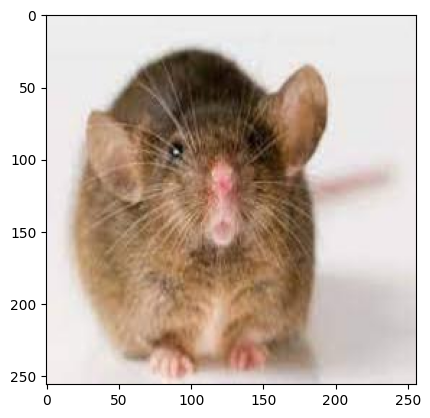

Predicted:  antelope 	 Actual:  spider+monkey


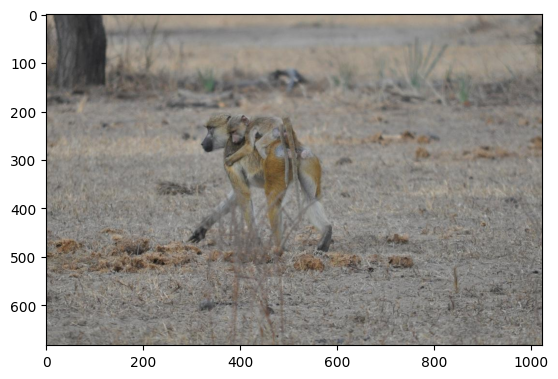

Predicted:  raccoon 	 Actual:  bobcat


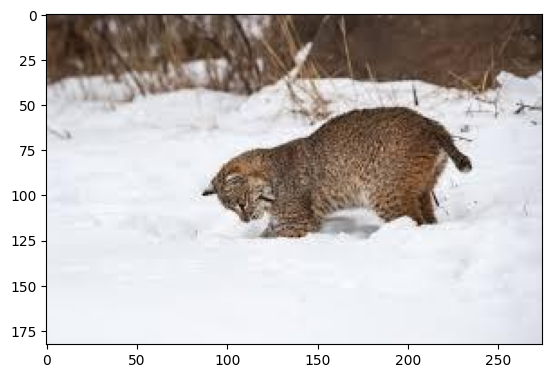

Predicted:  seal 	 Actual:  otter


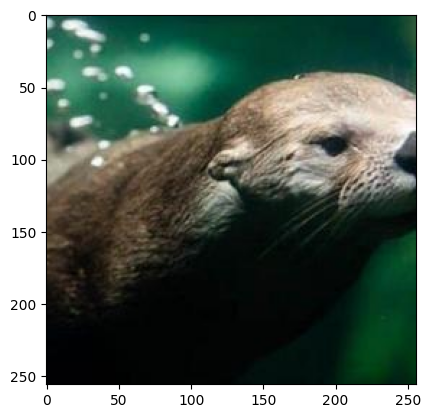

Predicted:  killer+whale 	 Actual:  hippopotamus


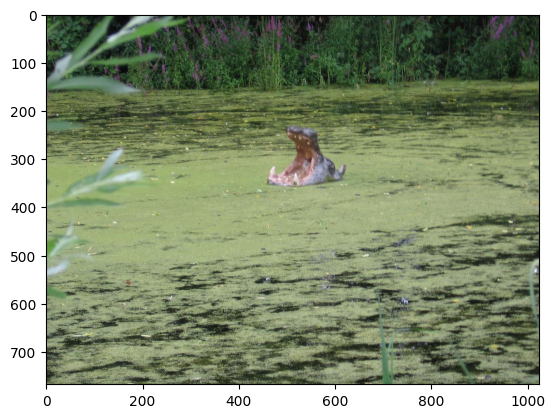

Predicted:  ox 	 Actual:  cow


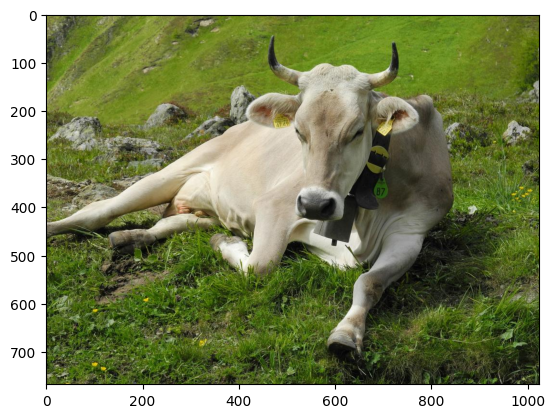

Predicted:  pig 	 Actual:  mole


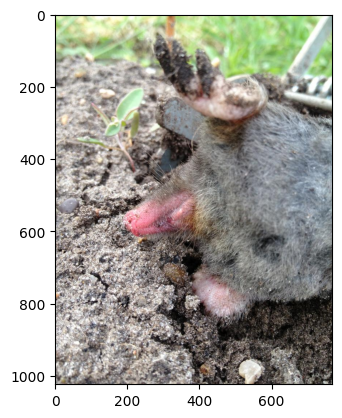

Predicted:  cow 	 Actual:  walrus


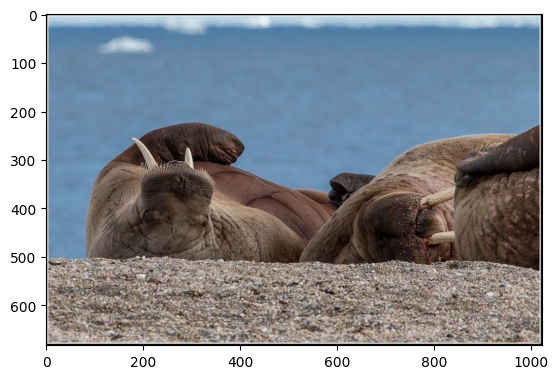

Predicted:  blue+whale 	 Actual:  humpback+whale


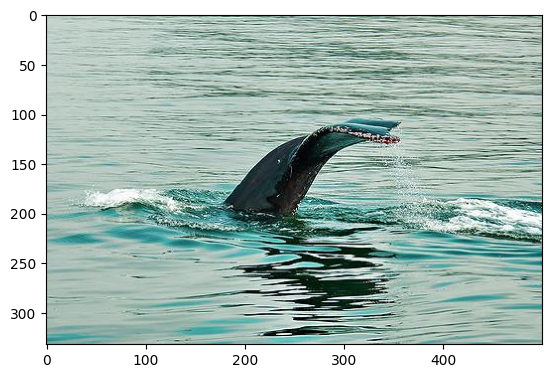

In [22]:
# Getting data of some wrong prediction to analyse the problem in the model
for i in range(300):
    if preds[i]!=valid_df.loc[i]['Label']:
        plt.imshow(Image.open(valid_df.loc[i]['Filepath']))
        print('Predicted: ',preds[i],'\t', 'Actual: ',valid_df.loc[i]['Label'])
        plt.show()

The model is having a bit issues on the whale class as the dataset has many similarities in the features.
The above examples confirms that the model is able to go good with classes having unique features but sometimes the similar feature images of different classes trouble it like of whales; shapes of rat, mouse and moles; similar poses in cat family and for some similar skin texture and body sizes. 

In [23]:
df = convert_path_to_df('/kaggle/input/vlg-recruitment-24-challenge/Special-Package/Special-Package')
df = df.sort_values('Filepath')
df.reset_index(inplace=True,drop=True)
with open('/kaggle/input/vlg-recruitment-24-challenge/Special-Package/Special-Package/labels.txt', encoding='utf8') as file_object:
    data = []
    for i in range(100):
        line = file_object.readline()
        data.append(line[:-1])

df['Label']=data

In [24]:
# Preparing the special package dataset
test = test_datagen.flow_from_dataframe(
    dataframe=df,
    x_col='Filepath',
    y_col='Label',
    target_size=TARGET_SIZE,
    color_mode='rgb',
    class_mode='categorical',
    batch_size=BATCH_SIZE,
    shuffle=False
)

Found 100 validated image filenames belonging to 34 classes.


In [25]:
pred = model.predict(test)
pred = np.argmax(pred,axis=1)

# Map the label
labels = (train_images_inceptionv3.class_indices)
labels = dict((v,k) for k,v in labels.items())
pred = [labels[k] for k in pred]

/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


4/4 ━━━━━━━━━━━━━━━━━━━━ 12s 2s/step


In [26]:
# Getting the accuracy on the special 
ans=0
for i in range(100):
    if pred[i]==df.loc[i]['Label']:
        ans=ans+1
print('The accuracy of the model on the given package is',ans/100)

The accuracy of the model on the given package is 0.88


The accuracy of our trained model is quite decent considering the number of classes to predict.

In [27]:
# Finding the wrong predictions of our model
for i in range(100):
    if pred[i]!=df.loc[i]['Label']:
        print('Predicted: ',pred[i],'\t', 'Actual: ',df.loc[i]['Label'])

Predicted:  deer 	 Actual:  german+shepherd
Predicted:  hamster 	 Actual:  rat
Predicted:  mouse 	 Actual:  rat
Predicted:  chihuahua 	 Actual:  siamese+cat
Predicted:  spider+monkey 	 Actual:  deer
Predicted:  fox 	 Actual:  weasel
Predicted:  sheep 	 Actual:  grizzly+bear
Predicted:  ox 	 Actual:  cow
Predicted:  mouse 	 Actual:  rat
Predicted:  mouse 	 Actual:  hamster
Predicted:  pig 	 Actual:  weasel
Predicted:  seal 	 Actual:  otter


This shows that our model is performing good on distinct classes. 
But sometimes with the similar type of classes like (hamster mouse and rat), it seems to have some problem within identifying the key differences. 
And so with some other classes which contain similar features within them

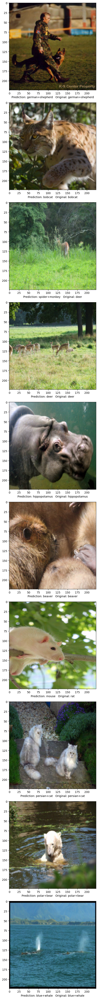

In [28]:
# Visualize the results at random
fig = plt.figure(figsize = (100,100))
for i in range(10):
    j = random.randint(0, 99)
    fig.add_subplot(20, 1, i+1)
    plt.xlabel("Prediction: " + pred[j] +"   Original: " + df.loc[j].Label)
    img = Image.open(df.loc[j].Filepath)
    plt.imshow(img)
    
fig.tight_layout()
plt.show()

## Thank You 😊